<a href="https://colab.research.google.com/github/4myLab/codestates/blob/main/session2/project/p1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!pip install category_encoders
!pip install statsmodels

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 69 kB 4.5 MB/s 
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [60]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
import os

from statsmodels.tsa.arima_model import ARIMA
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from statsmodels.tsa.arima_model import ARIMA
import statsmodels.api as sm

from google.colab import files

In [8]:
files.upload()

Saving 073240.csv to 073240.csv


{'073240.csv': b'\xec\x8b\x9c\xea\xb0\x84,\xed\x98\x84\xec\x9e\xac\xea\xb0\x80,\xec\xb2\xb4\xea\xb2\xb0\xeb\x9f\x89,\xeb\x93\xb1\xeb\x9d\xbd\xeb\xa5\xa0,\xec\xb2\xb4\xea\xb2\xb0\xea\xb0\x95\xeb\x8f\x84,\xeb\x88\x84\xec\xa0\x81\xea\xb1\xb0\xeb\x9e\x98\xeb\x9f\x89,\xeb\x88\x84\xec\xa0\x81\xea\xb1\xb0\xeb\x9e\x98\xeb\x8c\x80\xea\xb8\x88,\xec\xb4\x9d\xeb\xa7\xa4\xec\x88\x98\xec\x9e\x94\xeb\x9f\x89,\xec\xb4\x9d\xeb\xa7\xa4\xeb\x8f\x84\xec\x9e\x94\xeb\x9f\x89,\xeb\xa7\xa4\xec\x88\x98\xed\x98\xb8\xea\xb0\x801,\xeb\xa7\xa4\xec\x88\x98\xed\x98\xb8\xea\xb0\x802,\xeb\xa7\xa4\xec\x88\x98\xed\x98\xb8\xea\xb0\x803,\xeb\xa7\xa4\xec\x88\x98\xed\x98\xb8\xea\xb0\x804,\xeb\xa7\xa4\xec\x88\x98\xed\x98\xb8\xea\xb0\x805,\xeb\xa7\xa4\xec\x88\x98\xed\x98\xb8\xea\xb0\x806,\xeb\xa7\xa4\xec\x88\x98\xed\x98\xb8\xea\xb0\x807,\xeb\xa7\xa4\xec\x88\x98\xed\x98\xb8\xea\xb0\x808,\xeb\xa7\xa4\xec\x88\x98\xed\x98\xb8\xea\xb0\x809,\xeb\xa7\xa4\xec\x88\x98\xed\x98\xb8\xea\xb0\x8010,\xeb\xa7\xa4\xeb\x8f\x84\xed\x98\xb8\xea\

In [61]:
df = pd.read_csv('073240.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 86590 entries, 0 to 86589
Data columns (total 49 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   시간        86590 non-null  int64  
 1   현재가       86590 non-null  int64  
 2   체결량       86590 non-null  int64  
 3   등락률       86590 non-null  float64
 4   체결강도      86590 non-null  float64
 5   누적거래량     86590 non-null  float64
 6   누적거래대금    86590 non-null  float64
 7   총매수잔량     86590 non-null  int64  
 8   총매도잔량     86590 non-null  int64  
 9   매수호가1     86590 non-null  int64  
 10  매수호가2     86590 non-null  int64  
 11  매수호가3     86590 non-null  int64  
 12  매수호가4     86590 non-null  int64  
 13  매수호가5     86590 non-null  int64  
 14  매수호가6     86590 non-null  int64  
 15  매수호가7     86590 non-null  int64  
 16  매수호가8     86590 non-null  int64  
 17  매수호가9     86590 non-null  int64  
 18  매수호가10    86590 non-null  int64  
 19  매도호가1     86590 non-null  int64  
 20  매도호가2     86590 non-null  in

In [62]:
#Scaling (매수호가 매도호가는 대소보다 패턴만 파악하면 되기 때문에 Scaling을 진행한다)
scaler = MinMaxScaler()
quote_columns = df.columns[29:]
for col in quote_columns:
  df[col] = scaler.fit_transform(df[[col]])

In [63]:
#Slicing Condition (정규시장 기간은 09:00부터 15:30까지) 단일가 거래 15:20~15:30
cond1 = (df['시간'] > 90000) & (df['현재가'] != 0)
cond2 = (df['시간'] < 152000) & (df['현재가'] != 0)
cond3 = (df['시간'] > 90000) & (df['현재가'] == 0)
cond4 = (df['시간'] < 152000) & (df['현재가'] == 0)

In [64]:
# target 값 생성 (가격으로 할 수 있지만, 상승 or 하락을 정하는 것이 목표이기 때문에 현재가>전가격 이면 1 아니면 0 으로 분리)
def make_target(df):
  temp = df[cond1]['현재가'].iloc[0]
  target = []
  for i, value in enumerate(df['현재가']):    
    target.append(value > temp)
    temp = value
  df['target'] = target
  return df

df = make_target(df)

In [65]:
cur = 0 
# temp1 = on_df['현재가'].iloc[0]
# temp2 = on_df['등락률'].iloc[0]
temp1 = df[cond1]['현재가'].iloc[0]
temp2 = df[cond1]['등락률'].iloc[0]
for i, (value, perc) in enumerate(zip(df['현재가'],df['등락률'])):
  if value == 0:
    if cur == 0:
      df['현재가'][i] = temp1
      df['등락률'][i] = temp2
    else:
      df['현재가'][i] = temp1
      df['등락률'][i] = temp2
  else:
    cur = i
    temp1 = value
    temp2 = perc

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  del sys.path[0]


In [66]:
df['시간'] = df['시간'].astype(str)
df['시간'] = df['시간'].str.pad(width=6, side='left', fillchar='0')
df['시간'] = pd.to_datetime(df['시간'], format='%H%M%S')#.dt.time

In [67]:
# Slicing 가격 정보 / 호가정보 
on_df = df[cond1 & cond2]
quote_df = df[cond3 & cond4]
print(df.shape, on_df.shape, quote_df.shape)

(86590, 50) (32693, 50) (51844, 50)


In [ ]:
#시간 datetime으로 변경 해야 되는데 안되네....?? -> 시간 타입으로 바뀌어 있는데, 시간만 표시할 때는 object로 되는듯 
# on_df['시간'] = on_df['시간'].astype(str)
# on_df['시간'] = on_df['시간'].str.pad(width=6, side='left', fillchar='0')
# on_df['시간'] = pd.to_datetime(on_df['시간'], format='%H%M%S')#.dt.time
# quote_df['시간'] = quote_df['시간'].astype(str)
# quote_df['시간'] = quote_df['시간'].str.pad(width=6, side='left', fillchar='0')
# quote_df['시간'] = pd.to_datetime(quote_df['시간'], format='%H%M%S')#.dt.time

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

In [68]:
#체결량 - 불가/ 확인 해보니 +로 전환하면 누적거래량이랑 맞음
on_df['체결량'] = on_df['체결량'].apply(lambda x : (-1)*x if x < 0 else x)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [70]:
# Column 정리 (on_df)
drop_col1 = df.columns[7:49].tolist()+['체결강도']
on_df.drop(columns=drop_col1, inplace=True)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4913: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [71]:
on_df

,시간,현재가,체결량,등락률,누적거래량,누적거래대금,target
1061,1900-01-01 09:00:21,5840,32075,1.39,32503.0,190.0,True
1062,1900-01-01 09:00:21,5840,952,1.39,33455.0,195.0,False
1063,1900-01-01 09:00:21,5830,1871,1.22,35326.0,206.0,False
1064,1900-01-01 09:00:21,5820,1277,1.04,36603.0,214.0,False
1068,1900-01-01 09:00:22,5850,15,1.56,36618.0,214.0,True
...,...,...,...,...,...,...,...
85564,1900-01-01 15:19:58,6700,2519,16.32,7380036.0,46799.0,False
85565,1900-01-01 15:19:58,6700,409,16.32,7380445.0,46802.0,False
85568,1900-01-01 15:19:59,6700,500,16.32,7380945.0,46805.0,True
85570,1900-01-01 15:19:59,6700,2000,16.32,7382945.0,46819.0,True


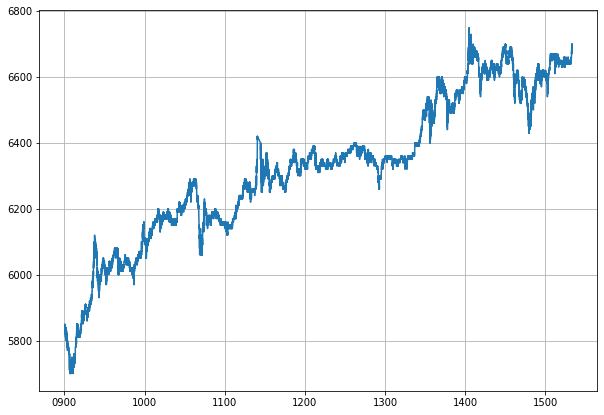

In [72]:
fig, ax = plt.subplots(figsize=(10,7))
ax.plot(on_df['시간'],on_df['현재가'])
dateFmt = mdates.DateFormatter('%H%M')
ax.xaxis.set_major_formatter(dateFmt)
plt.grid()
plt.show()
# pd.to_datetime(on_df['시간'])

In [73]:
quote_df.drop(columns=['체결량','체결강도','누적거래량','누적거래대금'], inplace=True)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4913: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [74]:
quote_df

,시간,현재가,등락률,총매수잔량,총매도잔량,매수호가1,매수호가2,매수호가3,매수호가4,매수호가5,...,매도호가수량2,매도호가수량3,매도호가수량4,매도호가수량5,매도호가수량6,매도호가수량7,매도호가수량8,매도호가수량9,매도호가수량10,target
1036,1900-01-01 09:00:01,5760,0.00,0,0,5840,5830,5820,0,0,...,0.028846,0.007222,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,False
1037,1900-01-01 09:00:01,5760,0.00,0,0,5840,5830,5820,0,0,...,0.028846,0.007222,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,False
1038,1900-01-01 09:00:02,5760,0.00,0,0,5840,5830,5820,0,0,...,0.028846,0.007222,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,False
1039,1900-01-01 09:00:03,5760,0.00,0,0,5840,5830,5820,0,0,...,0.028846,0.007222,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,False
1040,1900-01-01 09:00:04,5760,0.00,0,0,5840,5830,5820,0,0,...,0.028846,0.007222,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85562,1900-01-01 15:19:57,6700,16.32,36857,100602,6690,6680,6670,6660,6650,...,0.022734,0.057758,0.126777,0.109434,0.233866,0.087669,0.010483,0.004984,0.189212,False
85566,1900-01-01 15:19:58,6700,16.32,37157,97984,6690,6680,6670,6660,6650,...,0.022734,0.057758,0.126777,0.109434,0.233866,0.087669,0.010483,0.004984,0.189212,False
85567,1900-01-01 15:19:59,6700,16.32,37157,97675,6690,6680,6670,6660,6650,...,0.022734,0.058852,0.126777,0.109434,0.233866,0.087669,0.010483,0.004984,0.189212,False
85569,1900-01-01 15:19:59,6700,16.32,37157,97175,6690,6680,6670,6660,6650,...,0.022734,0.058852,0.126777,0.109434,0.233866,0.087669,0.010483,0.004984,0.189212,False


2가지 데이터 셋으로 분리 완료 on_df(가격 거래량 정보) / quote_df(호가창 정보)

In [76]:
on_df[on_df['target']==True]

,시간,현재가,체결량,등락률,누적거래량,누적거래대금,target
1061,1900-01-01 09:00:21,5840,32075,1.39,32503.0,190.0,True
1068,1900-01-01 09:00:22,5850,15,1.56,36618.0,214.0,True
1072,1900-01-01 09:00:24,5840,3,1.39,36635.0,214.0,True
1073,1900-01-01 09:00:24,5850,325,1.56,36960.0,216.0,True
1075,1900-01-01 09:00:25,5840,2,1.39,36962.0,216.0,True
...,...,...,...,...,...,...,...
85559,1900-01-01 15:19:57,6690,242,16.15,7376970.0,46779.0,True
85560,1900-01-01 15:19:57,6700,447,16.32,7377417.0,46782.0,True
85563,1900-01-01 15:19:58,6700,100,16.32,7377517.0,46782.0,True
85568,1900-01-01 15:19:59,6700,500,16.32,7380945.0,46805.0,True
